# Chapter 5: Convolution and Frequency Domain Filtering

In [1]:
%matplotlib inline 
from PIL import Image
from skimage.io import imread, imshow, show
import scipy.fftpack as fp
import numpy.fft as nfp
from scipy import ndimage, misc, signal
from skimage import data, color, restoration, img_as_float
from skimage.color import rgb2gray
from skimage.transform import rescale
from skimage.metrics import peak_signal_noise_ratio as psnr
import matplotlib.pylab as plt
from matplotlib.colors import LogNorm
import numpy as np
import numpy.fft
import timeit
import warnings
warnings.filterwarnings('ignore')

## Understanding Convolution

0.9921568627450982
(256, 256)


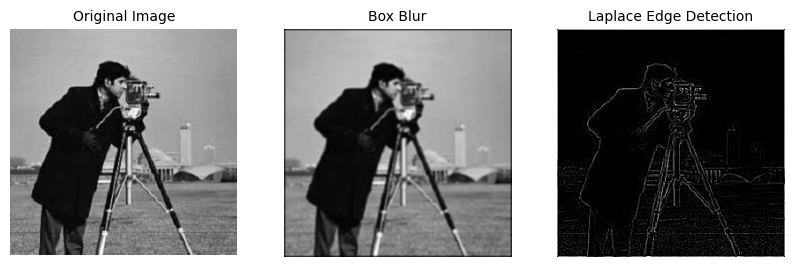

In [177]:
im = rgb2gray(imread('images/cameraman.jpg')).astype(float)
print(np.max(im))
print(im.shape)
blur_box_kernel = np.ones((3,3)) / 9
edge_laplace_kernel = np.array([[0,1,0],[1,-4,1],[0,1,0]])
im_blurred = signal.convolve2d(im, blur_box_kernel)
im_edges = np.clip(signal.convolve2d(im, edge_laplace_kernel), 0, 1)
fig, axes = plt.subplots(ncols=3, sharex=True, sharey=True, figsize=(10,4))
axes[0].imshow(im, cmap=plt.cm.gray)
axes[0].set_title('Original Image', size=10)
axes[1].imshow(im_blurred, cmap=plt.cm.gray)
axes[1].set_title('Box Blur', size=10)
axes[2].imshow(im_edges, cmap=plt.cm.gray)
axes[2].set_title('Laplace Edge Detection', size=10)
for ax in axes:
    ax.axis('off')
plt.show()

### Convolution modes, pad values, and boundary conditions

Depending on what you want to do with the edge pixels, there are three
arguments: `mode`, `boundary`, and `fillvalue`, which can be passed to the
`scipy.signal`'s `convolve2d()` function. 

* First let's discuss about the `mode` argument and its possible values:

    * `mode='full'`: This is the default mode, in which the output is the full discrete linear convolution of the input.
    * `mode='valid'`: This ignores edge pixels and only computes for those pixels with all neighbors (pixels that do not need zero-padding). The output image size is less than the input image size for all kernels (except 1 x 1).
    * `mode='same'`: The output image has the same size as the input image; it is centered with regards to the 'full' output.

* `boundary` is a flag indicating how to handle image boundaries, possible values are:
   * `fill`: pad input arrays with `fillvalue` (default)
   * `wrap`: circular boundary conditions
   * `symm`: symmetrical boundary conditions
   Use symmetric boundary condition to avoid creating edges at the image boundaries.

* `fillvalue` is an optional value to fill pad input arrays with, the default value is 0.

### Applying convolution to a color (RGB) image

With `scipy.signal`'s `convolve2d()`, we can **sharpen** an RGB image as well. We have to apply the
convolution separately for each image channel. Let's use the *tajmahal* image, with the **emboss** kernel and the **schar edge detection** complex kernel, using the next code snippet. You'll get your original image along with the convolved images with a couple of different kernels, as shown in the next figure.

1.0
(340, 527, 3)


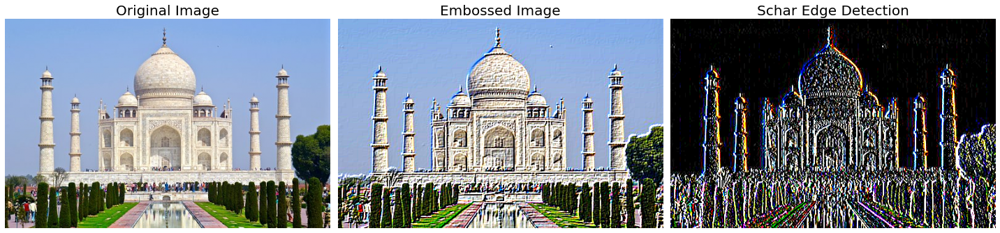

In [461]:
im = imread('images/tajmahal.jpg')
im = im / im.max() # scale each pixel value in [0,1]
print(np.max(im))
print(im.shape)
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]])
edge_schar_kernel = np.array([[ -3-3j, 0-10j, +3 -3j], [-10+0j, 0+ 0j, +10+0j], [ -3+3j, 0+10j, +3 +3j]])
im_embossed = np.ones(im.shape)
im_edges = np.ones(im.shape)
for i in range(3):
    im_embossed[...,i] = np.clip(signal.convolve2d(im[...,i], emboss_kernel, mode='same', boundary="symm"),0,1)
for i in range(3):
    im_edges[:,:,i] = np.clip(np.real(signal.convolve2d(im[...,i], edge_schar_kernel, mode='same', boundary="symm")),0,1)
fig, axes = plt.subplots(ncols=3, figsize=(20, 10))
axes[0].imshow(im)
axes[0].set_title('Original Image', size=20)
axes[1].imshow(im_embossed)
axes[1].set_title('Embossed Image', size=20)
axes[2].imshow(im_edges)
axes[2].set_title('Schar Edge Detection', size=20)
for ax in axes:
    ax.axis('off')
plt.tight_layout()
plt.show()

### Convolution with `scipy.ndimage`

With `scipy.ndimage.convolve()`, we can sharpen an RGB image directly (we do not
have to apply the convolution separately for each image channel).
Use the *victoria_memorial* image with $3 \times 3$ **sharpen**, **emboss** and **lighten** kernels defined in the next code snippet:

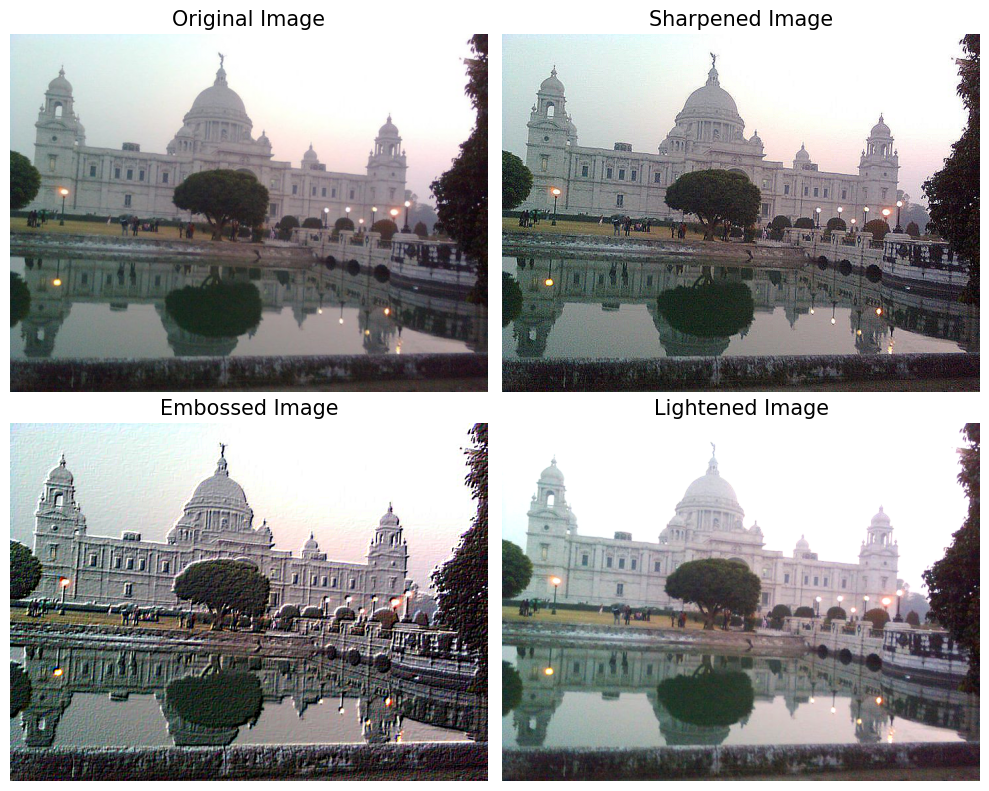

In [178]:
im = imread('images/victoria_memorial.png') # read as float
im = im / im.max()
sharpen_kernel = np.array([[0, -1, 0], [-1, 5, -1], [0, -1, 0]]).reshape((3, 3, 1))
emboss_kernel = np.array([[-2,-1,0],[-1,1,1],[0,1,2]]).reshape((3, 3, 1))
lighten_kernel = (np.array([[0,0,0], [0,12,0], [0,0,0]])/9).reshape((3, 3, 1))

im_sharp = np.clip(ndimage.convolve(im, sharpen_kernel, mode='nearest'), 0, 1) # clip (0 to 255) and convert to unsigned int
im_emboss = np.clip(ndimage.convolve(im, emboss_kernel, mode='nearest'), 0, 1)
im_draw = np.clip(ndimage.convolve(im, lighten_kernel, mode='nearest'), 0, 1)
plt.figure(figsize=(10,8))
plt.subplot(221), plt.imshow(im), plt.axis('off'), plt.title('Original Image', size=15)
plt.subplot(222), plt.imshow(im_sharp), plt.axis('off'), plt.title('Sharpened Image', size=15)
plt.subplot(223), plt.imshow(im_emboss), plt.axis('off'), plt.title('Embossed Image', size=15)
plt.subplot(224), plt.imshow(im_draw), plt.axis('off'), plt.title('Lightened Image', size=15)
plt.tight_layout()
plt.show()

### Convolution with `opencv-python`

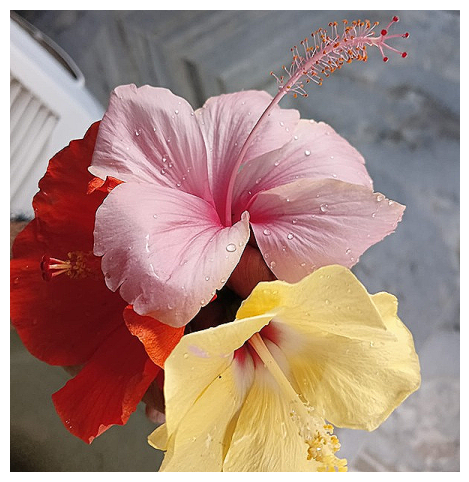

In [179]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load a grayscale image
image = cv2.cvtColor(cv2.imread('images/hibiscus.jpeg'), cv2.COLOR_BGR2RGB)

# Define a simple 3x3 sharpening kernel
kernel = np.array([[ 0, -1,  0],
                   [-1,  5, -1],
                   [ 0, -1,  0]], dtype=np.float32)

# Apply 2D convolution using filter2D()
filtered_image = cv2.filter2D(image, ddepth=-1, kernel=kernel)
plt.figure(figsize=(6,6))
plt.imshow(filtered_image), plt.axis('off');

### Benchmarking the performance of convolution implementations

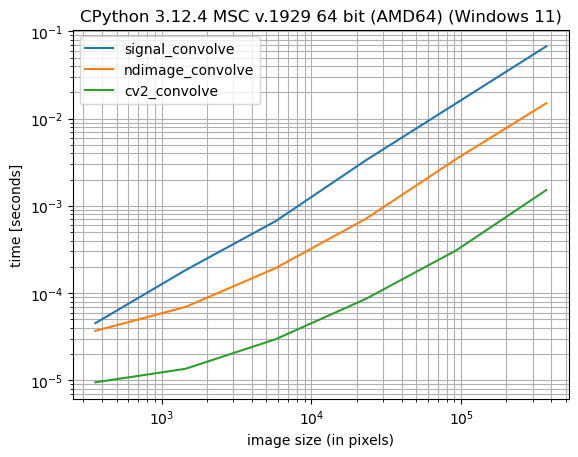

In [133]:
from simple_benchmark import benchmark
from datetime import timedelta

image = cv2.cvtColor(cv2.imread('images/hibiscus.jpeg'), cv2.COLOR_BGR2RGB)
num_pixels = np.prod(image.shape[:2])
kernel = np.array([[ 0, -1,  0],
                   [-1,  5, -1],
                   [ 0, -1,  0]], dtype=np.float32)

def signal_convolve(im):
    im_out = np.zeros_like(im)
    for i in range(3):
        im_out[...,i] = signal.convolve2d(im[...,i], kernel, mode='same', boundary="symm")
    return im_out

def ndimage_convolve(im):
    return ndimage.convolve(im, kernel[:,:,np.newaxis], mode='nearest')

def cv2_convolve(im):
    return cv2.filter2D(im, ddepth=-1, kernel=kernel)

b = benchmark(
    [signal_convolve, ndimage_convolve, cv2_convolve],
    {num_pixels*2**(-2*i): cv2.resize(image, None, fx=2**(-i), fy=2**(-i)) for i in range(5,-1,-1)},
    time_per_benchmark=timedelta(milliseconds=500),
    maximum_time=timedelta(milliseconds=500)
)

b.plot()
plt.xlabel('image size (in pixels)', size=10);

### Template matching

#### using cross-correlation

For a given image $I(x,y)$ and a template $T(i,j)$ of size $M×N$, the cross-correlation at position 
$(x,y)$ is computed as:

$$C(x, y) = \sum_{i=0}^{M-1} \sum_{j=0}^{N-1} I(x+i, y+j) \cdot T(i,j)$$

where:

$I(x+i,y+j)$ is the image pixel at position $(x+i,y+j)$.
$T(i,j)$ is the corresponding template pixel.
The sum is taken over all pixels in the template.
This formula measures the similarity between the template and the corresponding region of the image. Higher values of 
$C(x,y)$ indicate stronger matches.

**with** `scipy.signal`

In this example, we'll use (zero-mean) cross-correlation with the eye template image (using template image as kernel for cross-correlation with the original racoon face image), to find the location of the eye in the raccoon face image. Let's mark the location with the largest cross-correlation value (the best match with the template) with a red dot.  

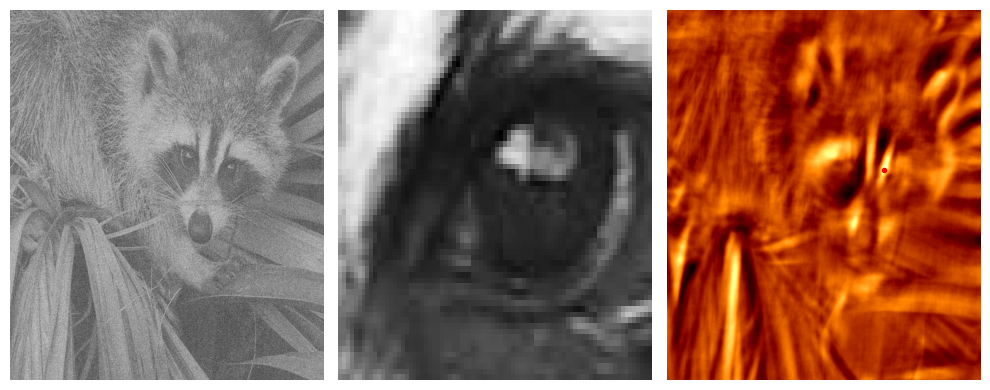

In [184]:
face_image = misc.face(gray=True) - misc.face(gray=True).mean()
template_image = np.copy(face_image[300:365, 670:750]) # right eye
template_image -= template_image.mean()
# add random noise
face_image = face_image + np.random.randn(*face_image.shape) * 50 
cc = signal.correlate2d(face_image, template_image,\
                                 boundary='symm', mode='same')
# find the match
y, x = np.unravel_index(np.argmax(cc), cc.shape)
# plot face_image, template_image, correlation (use cmap='afmhot')
plt.figure(figsize=(10,4))
plt.gray()
plt.subplot(131), plt.imshow(face_image, aspect='auto'), plt.axis('off')
plt.subplot(132), plt.imshow(template_image, aspect='auto'), plt.axis('off')
plt.subplot(133), plt.imshow(cc, cmap='afmhot', aspect='auto'), plt.plot(x, y, 'r.'), plt.axis('off')
plt.tight_layout()

#### using normalized cross-correlation

Cross-correlation measures similarity between an image $I$ and a template $T$, but it is sensitive to variations in lighting and contrast. Normalized cross-correlation (**NCC**) overcomes this issue by normalizing both the image and template, ensuring the correlation values remain between 
$[−1,1]$, making them scale and illumination invariant.

Mathematical Definition of NCC
The normalized cross-correlation at position $(x,y)$ is given by:

$${NCC}(x, y) = \frac{\sum_{i,j} \left( I(x+i, y+j) - \mu_I \right) \left( T(i,j) - \mu_T \right)}{\sqrt{\sum_{i,j} \left( I(x+i, y+j) - \mu_I \right)^2 \sum_{i,j} \left( T(i,j) - \mu_T \right)^2}}$$
​
where $μ_I$ and $μ_T$ are the mean values of the image patch and template, respectively. The numerator computes the zero-mean cross-correlation.
The denominator normalizes by the standard deviations, ensuring scale invariance.

**with** `scipy.signal`

In [185]:
def normalized_cross_correlation(image, template):
    # Compute means
    template_mean = np.mean(template)
    image_mean = signal.correlate2d(image, np.ones(template.shape), mode='valid') / template.size
    
    # Compute zero-mean template
    template_zero_mean = template - template_mean
    
    # Compute numerator: cross-correlation of zero-mean template with image
    numerator = signal.correlate2d(image, template_zero_mean, mode='valid')
    
    # Compute denominator: standard deviations
    image_std = np.sqrt(signal.correlate2d(image**2, np.ones(template.shape), mode='valid') / template.size - image_mean**2)
    template_std = np.std(template)
    
    # Avoid division by zero
    denominator = image_std * template_std
    denominator[denominator == 0] = 1e-10  # Small epsilon to prevent NaN values
    
    # Compute NCC
    ncc = numerator / denominator
    
    return ncc

ncc = normalized_cross_correlation(face_image, template_image)

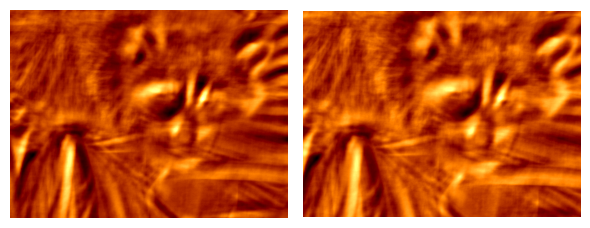

In [186]:
plt.figure(figsize=(6,4))
plt.subplot(121), plt.imshow(cc, cmap='afmhot'), plt.axis('off')
plt.subplot(122), plt.imshow(ncc, cmap='afmhot'), plt.axis('off')
plt.tight_layout()

**with** `opencv-python`

In [ ]:
import cv2
ncc2 = cv2.matchTemplate(face_image.astype(np.uint8), template_image.astype(np.uint8), method=cv2.TM_CCOEFF_NORMED)

# Plot the NCC result
plt.imshow(ncc2, cmap='afmhot'), plt.axis('off')

### Application of the convolution theorem

### Frequency domain Gaussian blur filter with `numpy.fft`

The following code block shows how to apply a Gaussian filter in the frequency domain using the convolution theorem and `numpy.fft` (since in the frequency domain it is simply multiplication). The following figure shows the output of the preceding code, the original lena image, the kernel, and the output image obtained after convolution, both in the spatial and frequency domains:

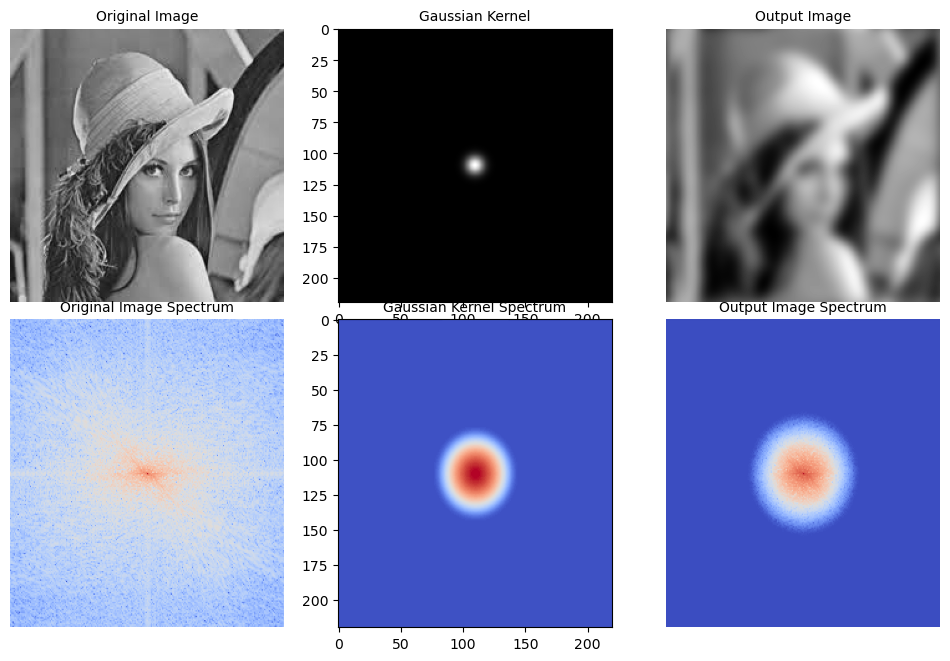

In [169]:
def plot_spectrum(F, method=None, cmap='coolwarm'):
    F_disp = (20*np.log10(0.01 + np.abs(F))).astype(int) if method == 'log' else np.minimum(np.abs(F).astype(int)+100, 255) 
    plt.imshow(F_disp, cmap=cmap, aspect='auto')

plt.figure(figsize=(12,8))
plt.gray() # show the filtered result in grayscale
im = np.mean(imread('images/lena.jpg'), axis=2)
gauss_kernel = np.outer(signal.windows.gaussian(im.shape[0], 5), signal.windows.gaussian(im.shape[1], 5))
freq = fp.fft2(im)
assert(freq.shape == gauss_kernel.shape)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain
im1 = fp.ifft2(convolved).real

plt.subplot(231), plt.imshow(im), plt.title('Original Image', size=10), plt.axis('off')
plt.subplot(232), plt.imshow(gauss_kernel), plt.title('Gaussian Kernel', size=10)
plt.subplot(233), plt.imshow(im1) # the imaginary part is an artifact
plt.title('Output Image', size=10), plt.axis('off')
plt.subplot(234), plot_spectrum(fp.fftshift(freq), 'log')
plt.title('Original Image Spectrum', size=10), plt.axis('off')
plt.subplot(235), plot_spectrum(fp.fftshift(freq_kernel), 'log')
plt.title('Gaussian Kernel Spectrum', size=10), plt.subplot(2,3,6)
plot_spectrum(fp.fftshift(convolved), 'log')
plt.title('Output Image Spectrum', size=10), plt.axis('off')
plt.subplots_adjust(wspace=0.2, hspace=0)
plt.show()

## The Gaussian LPF kernel 

In [95]:
im = rgb2gray(imread('images/lena.jpg'))
gauss_kernel = np.outer(signal.windows.gaussian(im.shape[0], 1), \
                        signal.windows.gaussian(im.shape[1], 1))
freq = fp.fft2(im)
freq_kernel = fp.fft2(fp.ifftshift(gauss_kernel))
convolved = freq*freq_kernel # by the convolution theorem, simply multiply in the frequency domain

### with a 2D plot

In [ ]:
def plot_spectrum_2d(F, ax, log=True, cmap='coolwarm', title=''):
    im = ax.imshow(fp.fftshift(F).real, cmap='coolwarm') if not log \
                   else ax.imshow(20*np.log10( 0.01 + fp.fftshift(F)).real, cmap='coolwarm') 
    # 0.01 is added to keep the argument to log function always positive
    ax.set_title(title)
    return im

fig, axes =	plt.subplots(nrows=2, ncols=2, figsize=(8,8))
axes = axes.ravel()
plot_spectrum_2d(freq_kernel, axes[0], False, title='H(u,v)')
plot_spectrum_2d(freq_kernel, axes[1], title='log H(u,v)')
plot_spectrum_2d(freq, axes[2], title='log F(u,v)')
im = plot_spectrum_2d(convolved, axes[3], title='log G(u,v)')
fig.subplots_adjust(right=0.8)
cbar_ax = fig.add_axes([0.85, 0.15, 0.05, 0.7])
fig.colorbar(im, cax=cbar_ax)
plt.show()

### with 3d plot

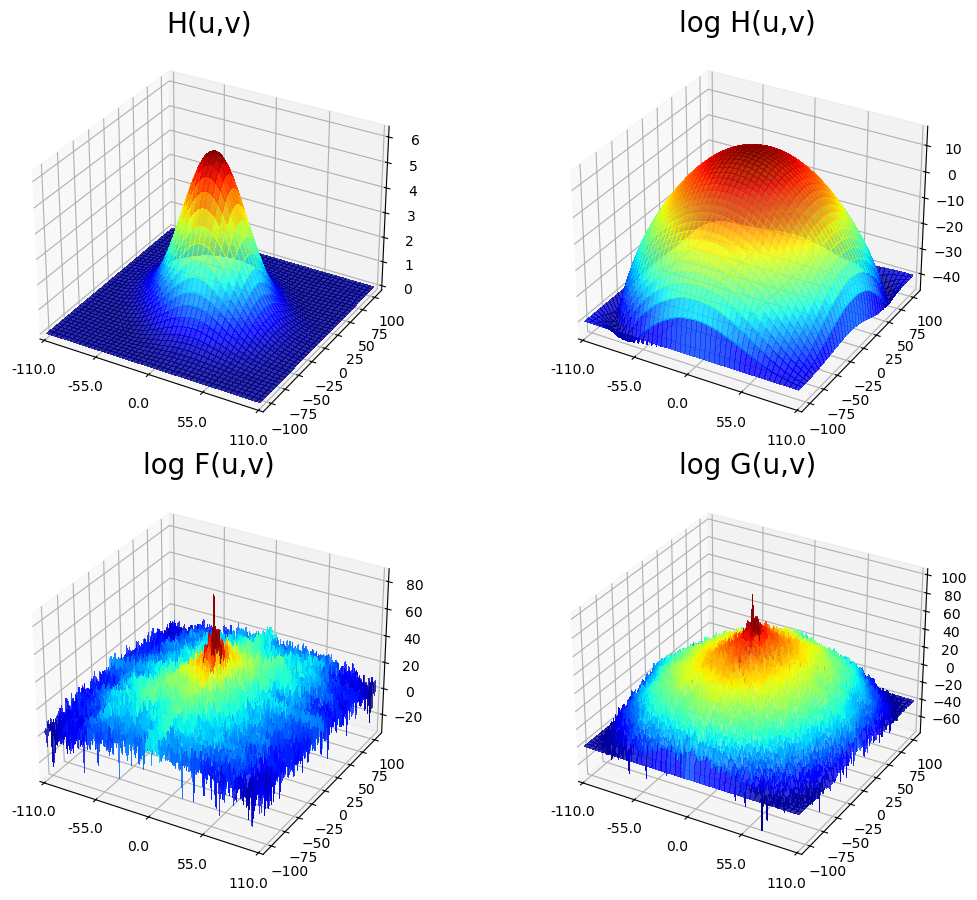

In [83]:
from matplotlib.ticker import LinearLocator, FormatStrFormatter

def plot_spectrum_3d(F, ax, cmap='jet', title=''):
 h, w = F.shape[0], F.shape[1]
 X, Y = range(-h//2, h-h//2), range(-w//2, w-w//2)
 Y, X = np.meshgrid(X, Y)
 surf = ax.plot_surface(X, Y, F, cmap=cmap, linewidth=0, antialiased=False, rstride=5,	cstride=5,	alpha=0.8)
 ax.set_xlim(-h//2, h//2)
 ax.set_ylim(-w//2, w//2)
 ax.xaxis.set_major_locator(LinearLocator(5))
 ax.xaxis.set_major_formatter(FormatStrFormatter('%.01f'))
 #ax.view_init(elev=10.) #,	azim=5)
 ax.set_title(title,	size=20)

fig, axes =	plt.subplots(subplot_kw={"projection": "3d"}, nrows=2, ncols=2, figsize=(12,9))
axes = axes.ravel()
plot_spectrum_3d(fp.fftshift(freq_kernel).real, axes[0], title='H(u,v)')
plot_spectrum_3d(20*np.log10( 0.01 + fp.fftshift(freq_kernel)).real, axes[1], title='log H(u,v)')
plot_spectrum_3d(20*np.log10( 0.01 + fp.fftshift(freq)).real, axes[2], title='log F(u,v)')
plot_spectrum_3d(20*np.log10( 0.01 + fp.fftshift(convolved)).real, axes[3], title='log G(u,v)')
plt.tight_layout()
plt.show()

### Frequency domain Gaussian blur filter with `scipy.signal.fftconvolve()`

The following code block shows how the `scipy.signal` module's `fftconvolve()` function
can be used to run the convolution in the frequency domain (internally by just a
multiplication and the convolution theorem). The following screenshot shows the output of the preceding code block in the spatial
domain:

(224, 225)


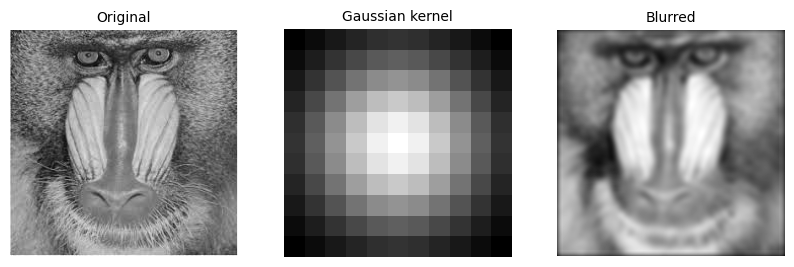

In [190]:
im = np.mean(plt.imread('images/mandrill.jpg'), axis=2)
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(signal.windows.gaussian(11, 3), signal.windows.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred = signal.fftconvolve(im, gauss_kernel, mode='same')
fig, (ax_original, ax_kernel, ax_blurred) = plt.subplots(1, 3, figsize=(10,5))
ax_original.imshow(im, cmap='gray')
ax_original.set_title('Original', size=10)
ax_original.set_axis_off()
ax_kernel.imshow(gauss_kernel, cmap='gray')
ax_kernel.set_title('Gaussian kernel', size=10)
ax_kernel.set_axis_off()
ax_blurred.imshow(im_blurred, cmap='gray')
ax_blurred.set_title('Blurred', size=10)
ax_blurred.set_axis_off()
fig.show()

The following code block shows how to plot the original and the blurred image spectrum after convolution. The following figure shows the output of the preceding code block in the frequency domain:

In [ ]:
F1 = fp.fft2((im).astype(float))
F2 = fp.fftshift( F1 )
plt.figure(figsize=(15,8))
plt.subplot(1,2,1), plot_spectrum(F2, 'log', cmap=plt.cm.gray)
plt.title('Original Image Spectrum', size=20)
F1 = fp.fft2((im_blurred).astype(float))
F2 = fp.fftshift( F1 )
plt.subplot(1,2,2), plot_spectrum(F2, 'log', cmap=plt.cm.gray)
plt.title('Blurred Image Spectrum', size=20)
plt.show()

The same code block as the previous one is used to compute a blurred version of the
Victoria Memorial Hall image, but this time the `fftconvolve()` function is invoked with a
larger ($50 \times 50$) Gaussian kernel with σ=10. The following screenshot shows the output of
the same code with the new image and the modified kernel:

![](images/LPF_vic.png)

### Comparing the runtimes of `scipy.convolve()` and `fftconvolve()` with the Gaussian blur kernel

We can use the Python `timeit` module to compare the runtimes of the image domain and
the frequency domain convolution functions. Since the frequency domain convolution
involves a single matrix multiplication instead of a series of sliding window arithmetic
computations, it is expected to be much faster. The following code block displays the original **Mandrill** image, as well as the blurred images, using both functions. If you run  the next code snippet you will obtain the following figure. As expected, both the `convolve()` and `fftconvolve()` functions result in the same blurred output image:

(224, 225)


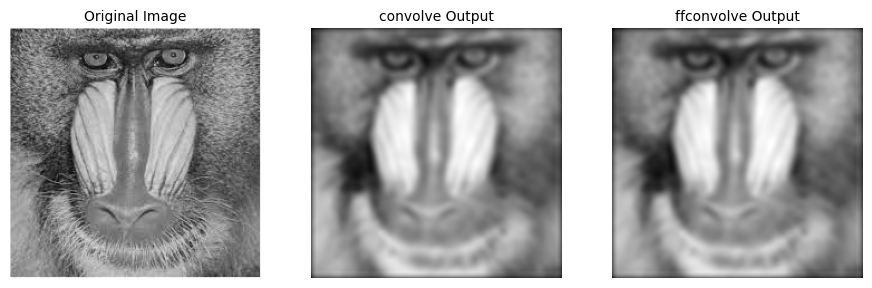

In [192]:
im = np.mean(plt.imread('images/mandrill.jpg'), axis=2)
print(im.shape)
# (224, 225)
gauss_kernel = np.outer(signal.windows.gaussian(11, 3), signal.windows.gaussian(11, 3)) # 2D Gaussian kernel of size 11x11 with σ = 3
im_blurred1 = signal.convolve(im, gauss_kernel, mode="same")
im_blurred2 = signal.fftconvolve(im, gauss_kernel, mode='same')
def wrapper_convolve(func):
    def wrapped_convolve():
        return func(im, gauss_kernel, mode="same")
    return wrapped_convolve
wrapped_convolve = wrapper_convolve(signal.convolve)
wrapped_fftconvolve = wrapper_convolve(signal.fftconvolve)
times1 = timeit.repeat(wrapped_convolve, number=1, repeat=100)
times2 = timeit.repeat(wrapped_fftconvolve, number=1, repeat=100)

plt.figure(figsize=(11,5))
plt.gray()
plt.subplot(131), plt.imshow(im), plt.title('Original Image',size=10), plt.axis('off')
plt.subplot(132), plt.imshow(im_blurred1), plt.title('convolve Output', size=10), plt.axis('off')
plt.subplot(133), plt.imshow(im_blurred2), plt.title('ffconvolve Output', size=10),plt.axis('off')
plt.show()

The following code compares the runtimes and visualizes the difference in between runtimes. Each of the functions has
been run on the same input image with the same Gaussian kernel $100$ times and then the
boxplot of the times taken for each function is plotted. As can be seen, `fftconvolve()` runs faster on average:

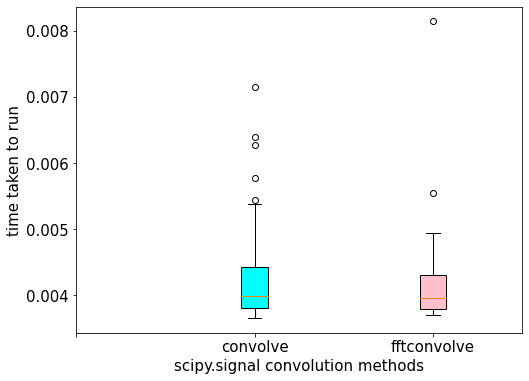

In [29]:
data = [times1, times2]
plt.figure(figsize=(8,6))
box = plt.boxplot(data, patch_artist=True) #notch=True,
colors = ['cyan', 'pink']
for patch, color in zip(box['boxes'], colors):
    patch.set_facecolor(color)
plt.xticks(np.arange(3), ('', 'convolve', 'fftconvolve'), size=15)
plt.yticks(fontsize=15)
plt.xlabel('scipy.signal convolution methods', size=15)
plt.ylabel('time taken to run', size = 15)
plt.show()

## 2D vs. 3D convolution

### 2D convolution

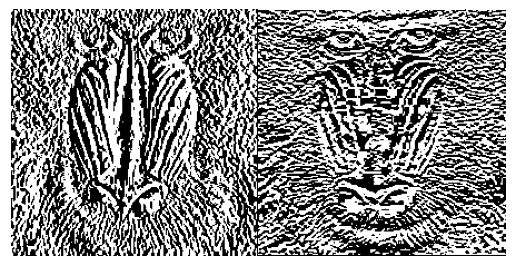

In [27]:
import torch 
import torch.nn.functional as F  
im = torch.from_numpy(np.mean(plt.imread('images/mandrill.jpg'), \
                                                axis=2)).float()
 
# creating the kernels  
# vertical kernel  
VK = torch.Tensor([ [1,0,-1],  
                [1,0,-1],  
                [1,0,-1] ]).view(1, 1, 3, 3) # kernel has to have a 
                                             # specific format  
# horizontal kernel  
HK = torch.Tensor([ [ 1, 1, 1],  
                [ 0, 0, 0],  
                [-1,-1,-1] ]).view(1, 1, 3, 3)  

C1 = F.conv2d(im.reshape(1,1,im.shape[0], im.shape[1]),VK) 
C2 = F.conv2d(im.reshape(1,1,im.shape[0], im.shape[1]),HK) 
C1, C2 = np.clip(C1.squeeze().numpy(),0,1), \
         np.clip(C2.squeeze().numpy(),0,1)

plt.gray()
plt.imshow(np.hstack((C1, C2))), plt.axis('off');

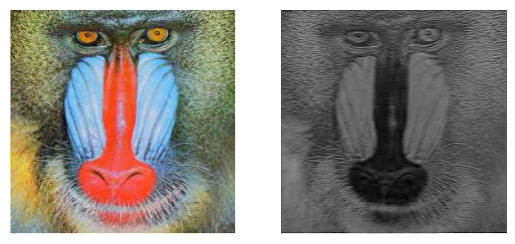

In [28]:
im = plt.imread('images/mandrill.jpg')
im = im / im.max()
im = torch.from_numpy(im).float()
 
# creating the kernel  
k = np.array([ [0,-1,0],  [-1,5,-1],  [0,-1,0] ])
K = np.repeat(k[:, :, np.newaxis], 3, axis=2) 
K = torch.Tensor(K).view(1, 3, 3, 3)
C = F.conv2d(im.permute(2,0,1)[None,...],K,  padding = "same") 
C = C.squeeze()

plt.gray()
plt.subplot(121), plt.imshow(im), plt.axis('off')
plt.subplot(122), plt.imshow(C.numpy()), plt.axis('off');

### 3D convolution

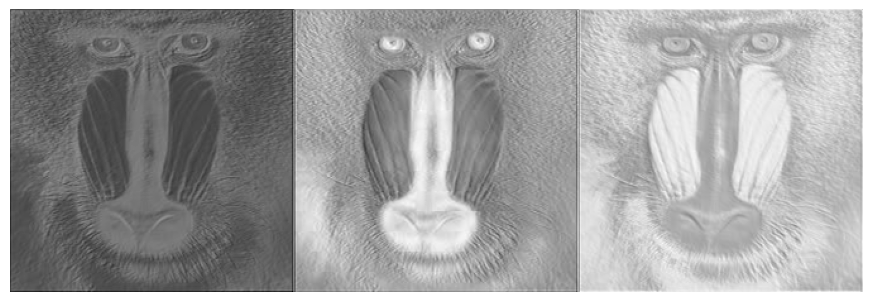

In [32]:
import torch 
im = plt.imread('images/mandrill.jpg')
im = im / im.max()
im = torch.from_numpy(im).float()
im = im.permute(2,0,1)[None,None,...]

K = torch.hstack((torch.Tensor([ [1,0,-1],  \
                			      [1,0,-1],  \
                                [1,0,-1] ]), \
                  torch.Tensor([ [ 1, 1, 1],  \
                			      [ 0, 0, 0],  \
                			      [-1,-1,-1] ]), \
                  torch.ones(3,3)/9)).view(1, 3, 3, 3)

C = F.conv3d(im, K[None,...],  padding = "same")
C = C.squeeze()

plt.figure(figsize=(11,5))
plt.gray()
plt.imshow(np.hstack(((C[0,...].numpy()), 
                        C[1,...].numpy(), 
                        C[2,...].numpy())))
plt.axis('off');

## Filtering in the frequency domain (HPF, LPF, BPF, and notch filters)

If we remember from the image processing pipeline described in Chapter 1, Getting Started
with Image Processing, the immediate next step after image acquisition is image preprocessing.
Images are often corrupted by random variations in intensity and illumination
or have poor contrast, and therefore can't be used directly and need to be enhanced. This is
where the filters are used.

### What is a filter?
Filtering refers to transforming pixel intensity values to reveal certain image characteristics
such as:

* Enhancement: This image characteristic improves contrast
* Smoothing: This image characteristic removes noise
* Template matching: This image characteristic detects known patterns

The filtered image is described by a discrete convolution and the filter is described by a $n \times n$ discrete convolution mask.

## High-Pass Filter (HPF)

This filter allows only high frequencies from the frequency domain representation of the
image (obtained with DFT) and blocks all low frequencies beyond a cut-off value. The
image is reconstructed with inverse DFT, and since the high-frequency components
correspond to edges, details, noise, and so on, HPFs tend to extract or enhance them. The
next few sections demonstrate how to use different functions from the `numpy`, `scipy`, and
`scikit-image` libraries to implement an HPF and the impact of an HPF on an image.
We can implement a HPF on an image with the following steps:
1. Perform a 2D FFT with scipy.fftpack fft2 and obtain the frequency domain
representation of the image
2. Keep only the high frequency components (get rid of the low frequency
components)
3. Perform an inverse FFT to reconstruct the image.

The Python code to implement an HPF is shown in the following code. As can be seen, the
high frequency components correspond more to the edges of an image, and the average
(flat) image information is lost as we get rid of more and more low frequency components. The following figure shows the original rhino image, the output of the preceding code:

In [ ]:
im = np.array(Image.open('images/rhino.jpg').convert('L'))
plt.figure(figsize=(10,10)), plt.imshow(im, cmap=plt.cm.gray), plt.axis('off')
plt.show()

The following code block shows how to plot the original rhino image spectrum in the
*logarithm* domain:

In [ ]:
freq = fp.fft2(im)
(h, w) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fp.fftshift(freq1)
plt.figure(figsize=(10,10)), plot_spectrum(freq2, 'log')
plt.show()

The next code snippet shows how to apply the HPF by blocking the low frequencies in the `numpy` 2D array. The following figure shows the spectrum of the rhino image after applying the HPF:

In [ ]:
# apply HPF
freq2[half_h-10:half_h+11,half_w-10:half_w+11] = 0 # select all but the first 20x20 (low) frequencies
plt.figure(figsize=(10,10))
plot_spectrum(freq2, 'log')
plt.show()

The following code block shows how to obtain the image back from the previous spectrum
by applying `ifft2()`. The next figure shows the output of the preceding code: the rhino image after the
HPF is applied. As can be seen, the edges in the image become more prominent—HPF finds
the edges (which correspond to higher frequencies) in the image:

In [ ]:
im1 = np.clip(fp.ifft2(fp.ifftshift(freq2)).real,0,255) # clip pixel values after IFFT
print(psnr(im, im1))
# 6.867478436727171
plt.imshow(im1, cmap='gray'), plt.axis('off')
plt.show()

Now let's see how the frequency cutoff value for an HPF changes the output image. We
start from the grayscale **cameraman** image, apply FFT to it, and reconstruct the output
image by blocking the low frequencies below the cut-of value $F$, which is also varied to see
the impact on the output obtained. The next code snippet shows the application of the HPF on the cameraman grayscale
image, with different frequency cut-off values, $F$. The following figure shows how the HPF detects edges more and discards the gross level information in the image as the cutoff frequency (F) increases:

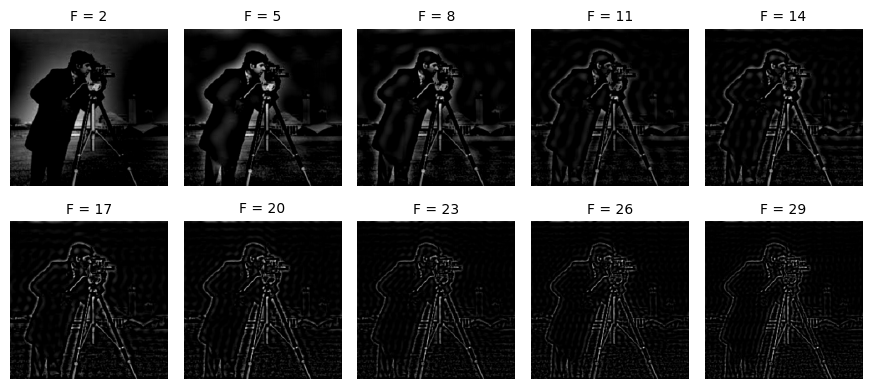

In [161]:
im = np.array(Image.open('images/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_hp = []
lbs = list(range(1,30,3))
plt.figure(figsize=(11,5))
for l in lbs:
    freq1 = np.copy(freq)
    freq2 = fp.fftshift(freq1)
    freq2[half_w-l:half_w+l+1,half_h-l:half_h+l+1] = 0 # select all but the first lxl (low) frequencies
    im1 = np.clip(fp.ifft2(fp.ifftshift(freq2)).real,0,255) # clip pixel values after IFFT
    snrs_hp.append(psnr(im, im1))
    plt.subplot(2,5,l//3+1), plt.imshow(im1, cmap='gray'), plt.axis('off')
    plt.title('F = ' + str(l+1), size=10)
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.show()

### How SNR changes with frequency cut-off

The following code block shows how to plot the change in the *peak signal to noise ratio* (**PSNR**)
with the cutoff frequency ($F$) for the HPF. The next figure shows how the PSNR of the output image decreases with the
increase in the cutoff frequency of the HPF.

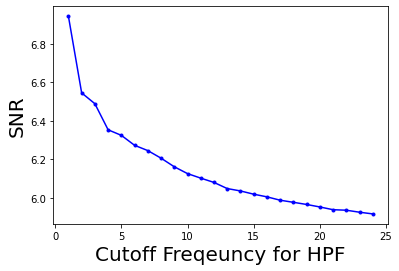

In [48]:
plt.plot(lbs, snrs_hp, 'b.-')
plt.xlabel('Cutoff Freqeuncy for HPF', size=20)
plt.ylabel('SNR', size=20)
plt.show()

## Low-pass filter (LPF)

This filter allows only the low frequencies from the frequency domain representation of the
image (obtained with DFT), and blocks all high frequencies beyond a cut-off value. The
image is reconstructed with inverse DFT, and since the high-frequency components
correspond to edges, details, noise, and so on, LPF tends to remove these. The next few
sections demonstrate how to use different functions from the numpy, scipy, and scikitimage
libraries to implement an LPF and the impact of an LPF on an image.

### LPF with `scipy.ndimage` and `numpy.fft`

The `numpy.fft` module's `fft2()` function can also be used to run FFT on an image.
The `scipy.ndimage` module provides a bunch of functions to apply LPF on image in the
frequency domain. The next section demonstrates one of these filters (namely
`fourier_gaussian()`) with an example.

### LPF with `fourier_gaussian`
This function from the `scipy.ndimage` module implements a multi-dimensional Gaussian
Fourier filter. The frequency array is multiplied with the Fourier transform of a Gaussian
kernel of a given size.

The next code block demonstrates how to use the LPF (weighted average filter) to blur the
lena grayscale image.

In [ ]:
fig, (axes1, axes2) = plt.subplots(1, 2, figsize=(20,10))
plt.gray() # show the result in grayscale
im = np.mean(imread('images/lena.jpg'), axis=2)
freq = nfp.fft2(im)
freq_gaussian = ndimage.fourier_gaussian(freq, sigma=4)
im1 = nfp.ifft2(freq_gaussian)
axes1.imshow(im), axes1.axis('off'), axes2.imshow(im1.real) # the imaginary part is an artifact
axes2.axis('off')
plt.show()

The following figure shows the output of the next code block and displays the frequency spectrum of the image after the Gaussian kernel is applied:

In [ ]:
plt.figure(figsize=(10,10))
plot_spectrum(nfp.fftshift(freq_gaussian), 'log')
plt.show()

### LPF with `scipy.fftpack`

We can implement a LPF on an image with the following steps:

1. Perform a 2D FFT with `scipy.fftpack.fft2()` and obtain the frequency domain
representation of the image
2. Keep only the low frequency components (get rid of the high frequency
components)
3. Perform an inverse FFT to reconstruct the image.

The Python code to implement an LPF is shown below. As we shall see, the low-frequency components in an image correspond to the average (flat) image information, whereas the high frequency components correspond more to the detailed information (for example, the edges) of an image is lost as we get rid of more and more high-frequency components.

For example, if we keep only the first-frequency component and discard all others, in the
resulting image obtained after inverse FFT we can hardly see the rhinos, but as we keep
more and more higher frequencies, they become prominent in the final image. The following figure shows the output of the following code snippet, the gross output image obtained without the finer details by applying LPF on the input rhino image and plot the spectrum of the image in the logarithm domain after blocking the high frequencies; in other words, only allowing the low frequencies to pass:

In [ ]:
im = np.array(Image.open('images/rhino.jpg').convert('L'))
# low pass filter
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
freq1 = np.copy(freq)
freq2 = fp.fftshift(freq1)
freq2_low = np.copy(freq2)
freq2_low[half_w-10:half_w+11,half_h-10:half_h+11] = 0 # block the lowfrequencies
freq2 -= freq2_low # select only the first 20x20 (low) frequencies, block the high frequencies
im1 = fp.ifft2(fp.ifftshift(freq2)).real
print(psnr(im, im1))
# 2.389151856495427
plt.imshow(im1, cmap='gray'), plt.axis('off')
plt.show()
plt.figure(figsize=(10,10))
plt.imshow( (20*np.log10( 0.1 + freq2)).astype(int))
plt.show()

The following code block shows the application of LPF on the cameraman grayscale image, with different frequency cutoff values, $F$. The next figure shows how LPF detects more and more details in the image as the cutoff frequency, $F$, increases:

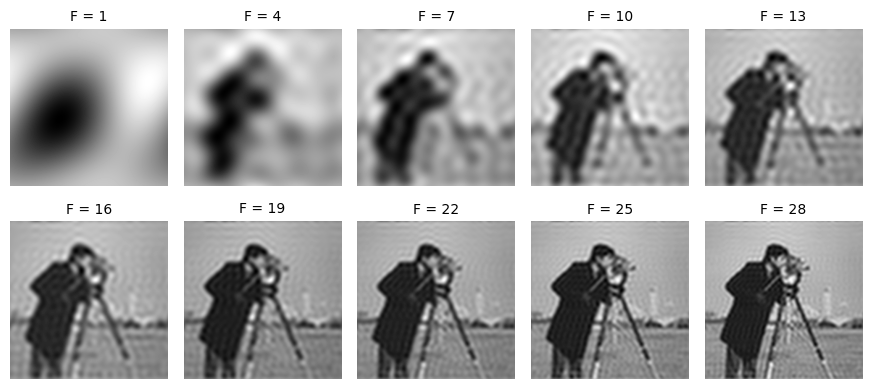

In [148]:
im = np.array(Image.open('images/cameraman.jpg').convert('L'))
freq = fp.fft2(im)
(w, h) = freq.shape
half_w, half_h = int(w/2), int(h/2)
snrs_lp = []
ubs = list(range(1,30,3))
plt.figure(figsize=(11,5))
for u in ubs:
    freq1 = np.copy(freq)
    freq2 = fp.fftshift(freq1)
    freq2_low = np.copy(freq2)
    freq2_low[half_w-u:half_w+u+1,half_h-u:half_h+u+1] = 0
    freq2 -= freq2_low # select only the first 20x20 (low) frequencies
    im1 = fp.ifft2(fp.ifftshift(freq2)).real
    snrs_lp.append(psnr(im, im1))
    plt.subplot(2,5,u//3+1), plt.imshow(im1, cmap='gray'), plt.axis('off')
    plt.title('F = ' + str(u), size=10)
plt.subplots_adjust(wspace=0.1, hspace=0)
plt.show()

### How SNR changes with frequency cutoff

The following code snippet shows how to plot the change in *peak signal to noise ratio* (**PSNR**) with cutoff frequency ($F$) for LPF. The following screenshot shows how SNR of the output image increases with the increase
in the cut-off frequency of LPF (indicating better reconstruction).

In [ ]:
plt.plot(ubs, snrs_lp, 'b.-')
plt.xlabel('Cutoff Freqeuncy for LPF', size=20)
plt.ylabel('PSNR', size=20)
plt.show()

### Ideal, Butterworth, Gaussian LPFs

In [100]:
from matplotlib.ticker import LinearLocator, FormatStrFormatter

def plot_spectrum_3d(F, ax, cmap='jet', title=''):
 h, w = F.shape[0], F.shape[1]
 X, Y = range(-int(np.floor(w/2)),int(np.ceil(w/2))), range(-int(np.floor(h/2)),int(np.ceil(h/2)))
 Y, X = np.meshgrid(X, Y)
 surf = ax.plot_surface(X, Y, F, cmap=cmap, linewidth=0, antialiased=False, rstride=5,	cstride=5,	alpha=0.8)
 ax.set_xlim(-h//2, h//2)
 ax.set_ylim(-w//2, w//2)
 #ax.xaxis.set_major_locator(LinearLocator(0.1))
 #ax.xaxis.set_major_formatter(FormatStrFormatter('%.02f'))
 #ax.view_init(elev=10.) #,	azim=5)
 ax.set_title(title,	size=15)

def plot_all(f, g, F, H, title):
    plt.figure(figsize=(10,5))
    plt.gray()
    plt.imshow(np.hstack((f, g))), plt.axis('off'), plt.title(title, size=15)
    plt.tight_layout()
    plt.show()
    
    fig, axes =	plt.subplots(subplot_kw={"projection": "3d"}, nrows=1, ncols=3, figsize=(11,5))
    axes = axes.ravel()
    plot_spectrum_3d(20*np.log10(0.01 + F).real, axes[0], title='log F(u,v)')
    #plot_spectrum_3d(20*np.log10(0.01 + H).real, axes[1], title='log H(u,v)')
    plot_spectrum_3d(H.real, axes[1], title='H(u,v)')
    plot_spectrum_3d(20*np.log10(0.01 + G).real, axes[2], title='log G(u,v)')
    plt.tight_layout()
    plt.show()

In [94]:
def dist(u, v):
    return np.sqrt(u**2 + v**2)

def get_grid(w, h):
    return np.meshgrid(range(-int(np.floor(w/2)),int(np.ceil(w/2))), range(-int(np.floor(h/2)),int(np.ceil(h/2)))) #, sparse=True)

def ideal(sz, D0):
    h, w = sz
    u, v = get_grid(w, h)
    return dist(u,v) < D0
    
def gaussian(sz, D0):
    h, w = sz
    u, v = get_grid(w, h)
    return np.exp(-dist(u,v)**2/(2*D0**2)) 

def butterworth(sz, D0, n=2):
    h, w = sz
    u, v = get_grid(w, h)
    return 1 / (1 + (dist(u,v)/D0)**(2*n))

def laplacian(sz):
    h, w = sz
    u, v = get_grid(w, h)
    return -(dist(u,v))**2 

def ideal(sz, D0):
    h, w = sz
    u, v = get_grid(w, h)
    return dist(u,v) < D0


def apply_filter(f, func, arg_dict):
    F = fp.fftshift(fp.fft2(f))
    H = func(**arg_dict) 
    G	=	H * F
    g	=	np.abs(fp.ifft2(G))
    g = g / g.max()
    return F, H, G, g

In [ ]:
from skimage import data, filters
from skimage.util import random_noise

#dir(data)
f = data.camera()
f = random_noise(f, var=0.1)

F, H, G, g = apply_filter(f, ideal, {'sz':f.shape, 'D0':10})
plot_all(f, g, F, H, 'original and ILF images')

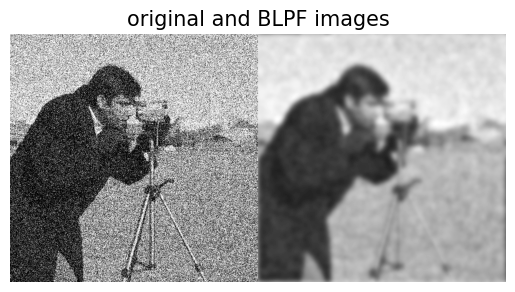

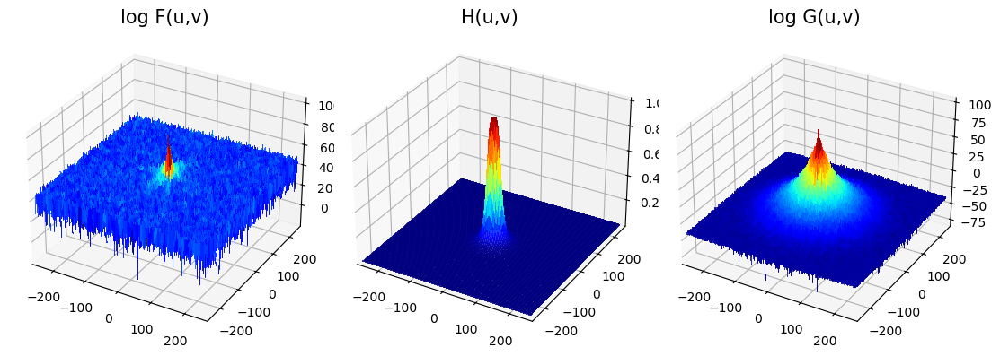

In [70]:
F, H, G, g = apply_filter(f, butterworth, {'sz':f.shape, 'D0':20, 'n':2})
plot_all(f, g, F, H, 'original and BLPF images')

In [ ]:
F, H, G, g = apply_filter(f, gaussian, {'sz':f.shape, 'D0':20})
plot_all(f, g, F, H, 'original and GLPF images')

### with skimage.filters

In [ ]:
#dir(data)
f = data.camera()
f = random_noise(f, var=0.1)

F, H, G, g = apply_filter(f, ideal, {'sz':f.shape, 'D0':10})
plot_all(f, g, F, H, 'original and ILF images')

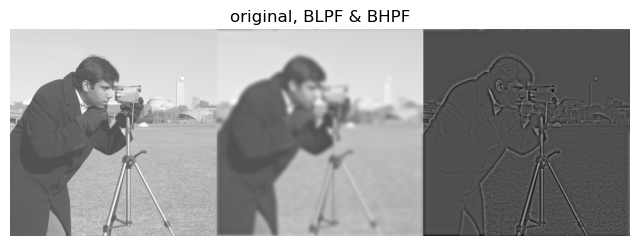

In [104]:
im_lpf = filters.butterworth(
                im,
                cutoff_frequency_ratio=0.05,
                order=2,
                high_pass=False,
                squared_butterworth=True,
                npad=0,
            )
im_hpf = filters.butterworth(
                im,
                cutoff_frequency_ratio=0.05,
                order=2,
                high_pass=True,
                squared_butterworth=True,
                npad=0,
            )
plt.figure(figsize=(8,4))
plt.gray()
plt.imshow(np.hstack((im, im_lpf, im_hpf))), plt.title('original, BLPF & BHPF'), plt.axis('off');

### Homomorphic Filter

(371, 505)


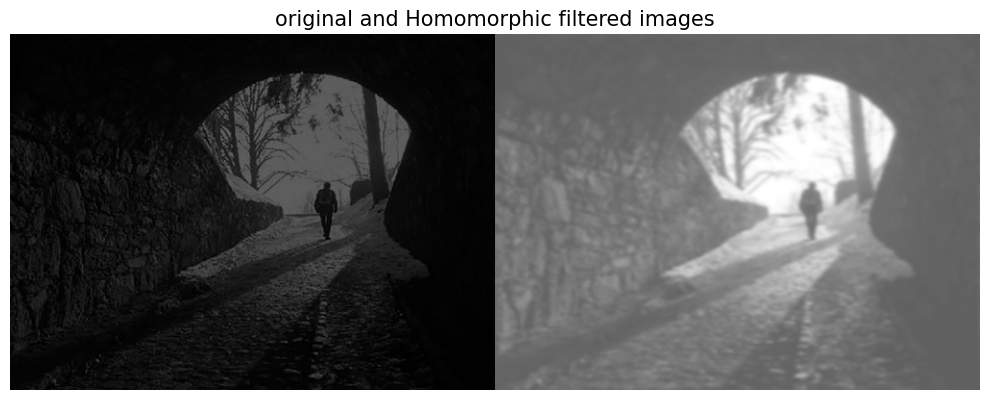

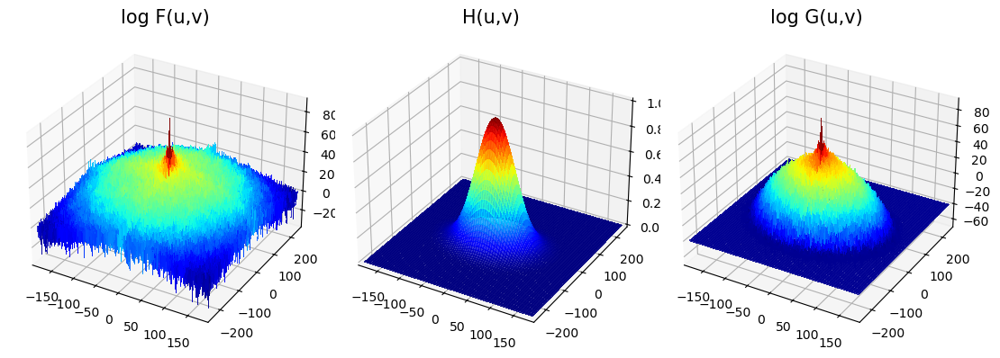

In [102]:
from skimage.io import imread
f = imread('images/illum.png', as_gray=True)
print(f.shape)
F, H, G, g = apply_filter(np.log(1+f), gaussian, {'sz':f.shape, 'D0':40})
g = np.exp(g)
plot_all(f, g, F, H, 'original and Homomorphic filtered images')

### Frequency domain Laplacian

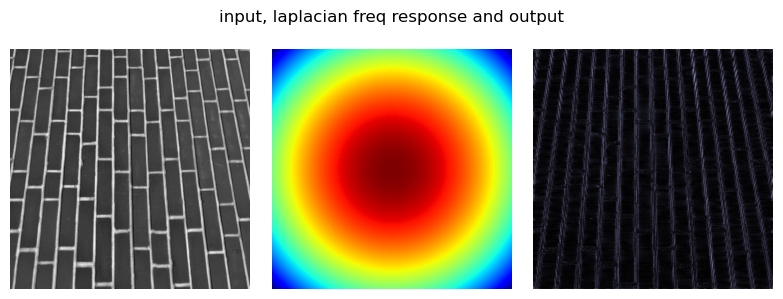

In [47]:
import cv2
import numpy as np
from skimage import data

f = data.brick()
f = f / f.max()
h, w = f.shape
F = np.fft.fftshift(cv2.dft(f))
u, v = np.meshgrid(range(-w//2,w//2), range(-h//2,h//2))
H = (lambda u, v: -(dist(u,v))**2)(u, v)
G = F*H
g = np.abs(cv2.idft(G))
g = g / g.max()
plt.figure(figsize=(8,3))
plt.subplot(131), plt.imshow(f, cmap='gray'), plt.axis('off')
plt.subplot(132), plt.imshow(H, cmap='jet'), plt.axis('off')
plt.subplot(133), plt.imshow(g, cmap='bone'), plt.axis('off')
plt.suptitle('input, laplacian freq response and output')
plt.tight_layout()

## Band-pass filter (BPF) with DoG

The Difference of Gaussian (**DoG**) kernel can be used as a BPF to allow the frequencies in
a certain band and discard all other frequencies. The following code block shows how the
DoG kernel can be used with fftconvolve() to implement a BPF. The next figure shows the output of the preceding code block, the output image obtained with the BPF:

In [ ]:
im = img_as_float(plt.imread('images/tigers.jpeg'))
plt.figure(), plt.imshow(im), plt.axis('off'), plt.show()
x = np.linspace(-10, 10, 15)
kernel_1d = np.exp(-0.005*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel1 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
kernel_1d = np.exp(-5*x**2)
kernel_1d /= np.trapz(kernel_1d) # normalize the sum to 1
gauss_kernel2 = kernel_1d[:, np.newaxis] * kernel_1d[np.newaxis, :]
DoGKernel = gauss_kernel1[:, :, np.newaxis] - gauss_kernel2[:, :, np.newaxis]
im = signal.fftconvolve(im, DoGKernel, mode='same')
plt.figure(), plt.imshow(np.clip(im, 0, 1)), print(np.max(im)),
plt.show()

## Band-stop (notch) filter

This filter blocks/rejects a few chosen frequencies from the frequency domain
representation of the image (obtained with DFT), and hence the name. It is useful for
removing periodic noise from images, as discussed in the next section.

### Using a notch filter to remove periodic noise from images

In this example, we will first add some periodic (sinusoidal) noise to the parrot image to
create a noisy parrot image (this can happen because of interference with some electrical
signal) and then observe the effect of the noise in the frequency domain of the image using
the following code snippet. The following screenshot shows the output of the preceding code block. As can be seen, the
periodic noise there on the horizontal line became more prominent in the frequency
spectrum around $u = 175$:

(340, 453)


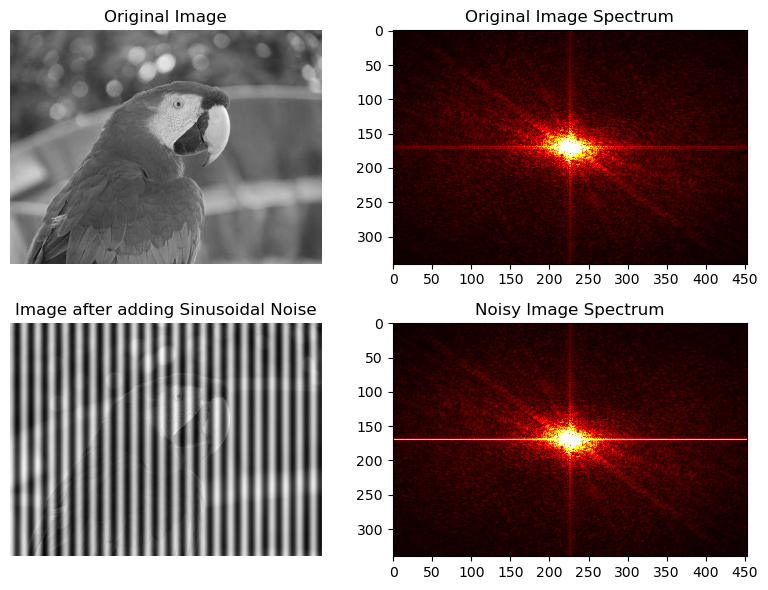

In [164]:
def plot_spectrum(F, method=None, cmap='coolwarm'):
    F_disp = (20*np.log10(0.01 + np.abs(F))).astype(int) if method == 'log' else np.minimum(np.abs(F).astype(int)+100, 255) 
    plt.imshow(F_disp, cmap=cmap, aspect='auto')

plt.figure(figsize=(8,6))
im =  np.mean(imread("images/parrot.jpg"), axis=2) / 255
print(im.shape)
plt.subplot(2,2,1), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.title('Original Image')
F1 = fp.fft2((im).astype(float))
F2 = fp.fftshift( F1 )
plt.subplot(2,2,2), plot_spectrum(F2, cmap=plt.cm.hot)
plt.xticks(np.arange(0, im.shape[1], 50))
plt.yticks(np.arange(0, im.shape[0], 50))
plt.title('Original Image Spectrum')
# add periodic noise to the image
for n in range(im.shape[1]):
    im[:, n] += np.cos(0.1*np.pi*n)
plt.subplot(2,2,3), plt.imshow(im, cmap='gray'), plt.axis('off')
plt.title('Image after adding Sinusoidal Noise')
F1 = fp.fft2((im).astype(float)) # noisy spectrum
F2 = fp.fftshift( F1 )
plt.subplot(2,2,4), plot_spectrum(F2, cmap=plt.cm.hot)
plt.xticks(np.arange(0, im.shape[1], 50))
plt.yticks(np.arange(0, im.shape[0], 50))
plt.title('Noisy Image Spectrum')
plt.tight_layout()
plt.show()

Now let's design a band-stop/band-reject (notch) filter to eliminate the frequencies that are responsible for noise by setting the corresponding frequency components to zero in the next code snippet. The following screenshot shows the output of the preceding code block, the restored image by applying the notch filter. As can be seen, the original image looks sharper than the restored one, since some true frequencies from the original image are also rejected by the
band-reject filter along with the noise.

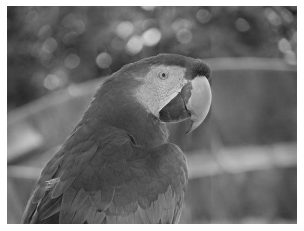

In [84]:
F2[170:176,:220] = F2[170:176,230:] = 0 # eliminate the frequencies most likely responsible for noise (keep some low frequency components)
im1 = fp.ifft2(fp.ifftshift( F2 )).real
plt.axis('off'), plt.imshow(im1, cmap='gray')
plt.show()

### The Gaussian Bandstop Filter

$$H_{LP}(u,v)=e^{-D^2(u,v)/2D_L^2}$$
$$H_{HP}(u,v)=1-e^{-D^2(u,v)/2D_H^2}$$
$$H_{BR}=H_{LP}*H_{HP}$$

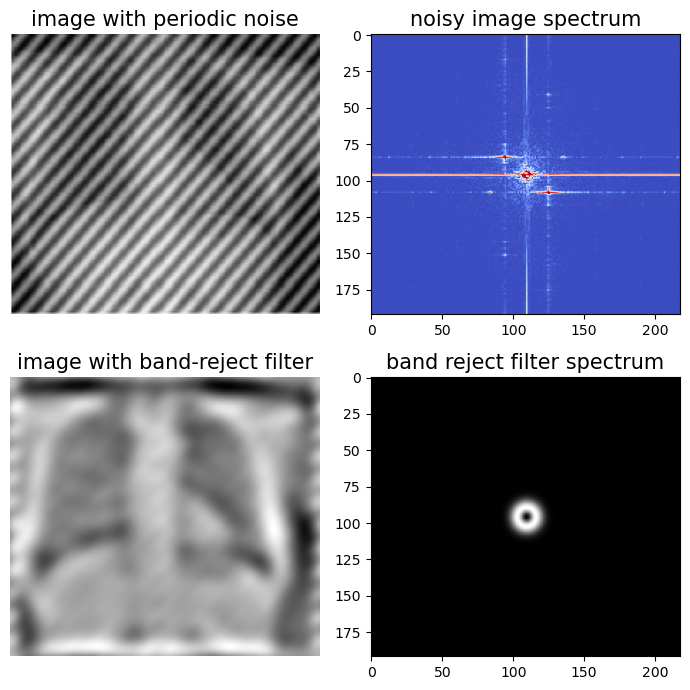

In [162]:
def plot_spectrum(F, ax, method=None, cmap='coolwarm'):
    F_disp = (20*np.log10(0.01 + np.abs(F))).astype(int) if method == 'log' else np.minimum(np.abs(F).astype(int)+100, 255) 
    ax.imshow(F_disp, cmap=cmap, aspect='auto')

def gaussian_bandpass_filter(image):
    #Fourier Transform
    image_freq = np.fft.fftshift(np.fft.fft2(image)) 
    #Size of Image
    m, n = np.shape(image_freq)
    # Find the center
    u0, v0 = int(n/2), int(m/2)
    u, v = np.meshgrid(range(n), range(m))
    DL, DH = 5, 9
    D2 = (u-u0)**2+(v-v0)**2
    gaussian_filter = np.exp(-0.5*D2/DL**2) * (1 - np.exp(-0.5*D2/DH**2))
    #Apply the filter
    fourier_transform = image_freq * gaussian_filter
    rec_image = np.fft.ifft2(np.fft.ifftshift(fourier_transform))
    return rec_image, image_freq, gaussian_filter

im = imread('images/heart.png', as_gray=True) #Image.open('images/USc6e.png').convert('L')
im = im / im.max()
im_rec, F, G = gaussian_bandpass_filter(im)
im_rec = im_rec.real

fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(7,7))
axes = axes.ravel()
plt.gray()
axes[0].imshow(im, aspect='auto'), axes[0].axis('off'), axes[0].set_title('image with periodic noise', size=15)
plot_spectrum(F.real, axes[1], False), axes[1].set_title('noisy image spectrum', size=15)
axes[2].imshow(im_rec/im_rec.max(), aspect='auto'), axes[2].axis('off'), axes[2].set_title('image with band-reject filter', size=15)
axes[3].imshow(G, aspect='auto'), axes[3].set_title('band reject filter spectrum', size=15)
plt.tight_layout()
plt.show()

## Fourier Feature Networks

In [8]:
# un on Colab GPU / TPU
#!pip install imageio-ffmpeg
#!git clone https://github.com/tancik/fourier-feature-networks
#%cd fourier-feature-networks

In [3]:
import jax.numpy as np
from jax import jit, grad, random
from jax.example_libraries import stax, optimizers

import matplotlib.pyplot as plt
from tqdm.notebook import tqdm
import os, imageio.v2 as imageio

rand_key = random.PRNGKey(0)

In [4]:
class FourierFeatNet:

  def __init__(self, img, B, num_layers, num_channels):
    self.I = img / img.max()
    self.B, self.L, self.C = B, num_layers, num_channels
    self.train_test_split()
    self.build_network()

  def train_test_split(self):
    # Create input pixel coordinates in the unit square
    coords = np.linspace(0, 1, self.I.shape[0], endpoint=False)
    x_test = np.stack(np.meshgrid(coords, coords), -1)
    self.test_data = [x_test, self.I]
    self.train_data = [x_test[::2, ::2], self.I[::2, ::2]]

  # Fourier feature mapping
  def map_input(self, x):
    if self.B is None:
      return x
    else:
      x_proj = (2.*np.pi*x) @ self.B.T
      return np.concatenate([np.sin(x_proj), np.cos(x_proj)], axis=-1)

  # JAX network definition
  def build_network(self):
      layers = []
      for i in range(self.L-1):
          layers.append(stax.Dense(self.C))
          layers.append(stax.Relu)
      layers.append(stax.Dense(3))
      layers.append(stax.Sigmoid)
      self.FFN = stax.serial(*layers)

  # Train model with given hyperparameters and data
  def train_model(self, learning_rate, iters):

      init_fn, apply_fn = self.FFN[0], self.FFN[1]

      model_pred = jit(lambda params, x: apply_fn(params, self.map_input(x)))
      model_loss = jit(lambda params, x, y: .5 * np.mean((model_pred(params, x) - y) ** 2))
      model_psnr = jit(lambda params, x, y: -10 * np.log10(2.*model_loss(params, x, y)))
      model_grad_loss = jit(lambda params, x, y: grad(model_loss)(params, x, y))

      opt_init, opt_update, get_params = optimizers.adam(learning_rate)
      opt_update = jit(opt_update)

      _, params = init_fn(rand_key, (-1, self.map_input(self.train_data[0]).shape[-1]))
      opt_state = opt_init(params)

      train_psnrs = []
      test_psnrs = []
      pred_imgs = []
      xs = []
      for i in tqdm(range(iters), desc='train iter', leave=False):
          opt_state = opt_update(i, model_grad_loss(get_params(opt_state), *self.train_data), opt_state)

          if i % 25 == 0:
              train_psnrs.append(model_psnr(get_params(opt_state), *self.train_data))
              test_psnrs.append(model_psnr(get_params(opt_state), *self.test_data))
              pred_imgs.append(model_pred(get_params(opt_state), self.test_data[0]))
              xs.append(i)

      return {
          'state': get_params(opt_state),
          'train_psnrs': train_psnrs,
          'test_psnrs': test_psnrs,
          'pred_imgs': np.stack(pred_imgs),
          'xs': xs,
      }

def plot_output(outputs):

    # Show final network outputs

    plt.figure(figsize=(24, 4))
    N = len(outputs)
    for i, k in enumerate(outputs):
        plt.subplot(1, N+1, i+1)
        plt.imshow(outputs[k]['pred_imgs'][-1]), plt.axis('off')
        plt.title(k)
    plt.subplot(1, N+1, N+1)
    plt.imshow(img)
    plt.title('GT'), plt.axis('off')
    plt.show()

    # Plot train/test error curves

    plt.figure(figsize=(16, 6))

    plt.subplot(121)
    for i, k in enumerate(outputs):
        plt.plot(outputs[k]['xs'], outputs[k]['train_psnrs'], label=k)
    plt.title('Train error')
    plt.ylabel('PSNR')
    plt.xlabel('Training iter')
    plt.legend()

    plt.subplot(122)
    for i, k in enumerate(outputs):
        plt.plot(outputs[k]['xs'], outputs[k]['test_psnrs'], label=k)
    plt.title('Test error')
    plt.ylabel('PSNR')
    plt.xlabel('Training iter')
    plt.legend()

    plt.show()

In [5]:
num_layers, num_channels = 4, 256
learning_rate = 1e-4
iters = 2000
mapping_size = 256

B_dict = {}
# Standard network - no mapping
B_dict['none'] = None
# Basic mapping
B_dict['basic'] = np.eye(2)
# Three different scales of Gaussian Fourier feature mappings
B_gauss = random.normal(rand_key, (mapping_size, 2))
for scale in [1., 10., 100.]:
  B_dict[f'gauss_{scale}'] = B_gauss * scale

img = imageio.imread('cat.jpg')[..., :3]

# This should take about 2-3 minutes
outputs = {}
for k in tqdm(B_dict):
  outputs[k] = FourierFeatNet(img, B_dict[k], num_layers, num_channels).train_model(learning_rate, iters)

  0%|          | 0/5 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

train iter:   0%|          | 0/2000 [00:00<?, ?it/s]

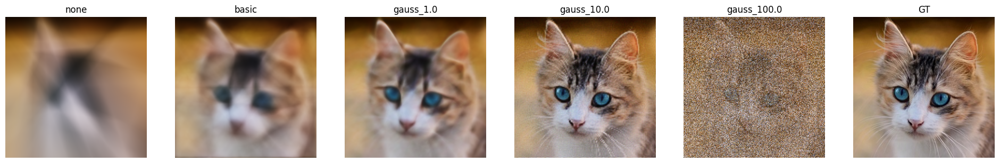

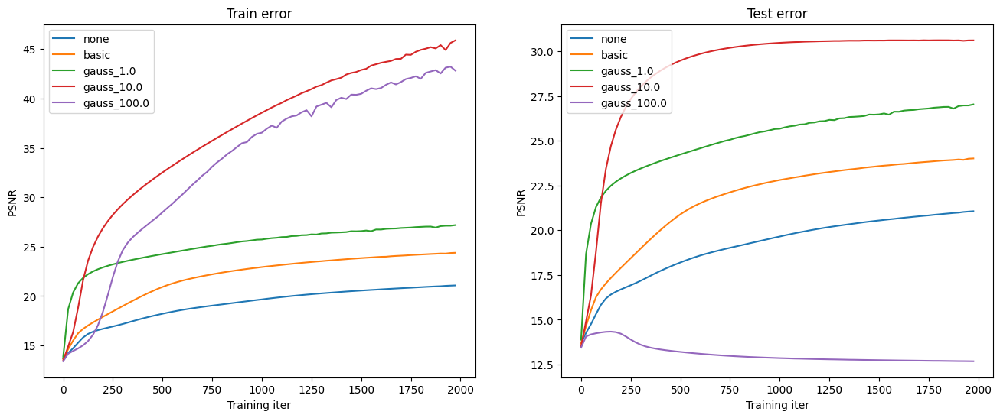

In [ ]:
plot_output(outputs)